## Settings

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from DataTransformation import LowPassFilter
from scipy.signal import argrelextrema
from sklearn.metrics import mean_absolute_error

In [29]:
# Matplotlib settings
# plt.style.available
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (20, 5)
plt.rcParams['figure.dpi'] = 100
plt.rcParams['lines.linewidth'] = 2

## Load Data

In [30]:
# Get the first processed data
df = pd.read_pickle('../../data/interim/01_data_processed.pkl')
df

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90


## Pre-processing

In [31]:
# Remove Rest labels as it's meaningless to count repetition for it.
df = df[df['label']!='rest']
df['label'].unique()

<StringArray>
['bench', 'ohp', 'squat', 'dead', 'row']
Length: 5, dtype: str

In [32]:
# Add sum of squares features as it might be useful.
acc_r = df['acc_x']**2 + df['acc_y']**2 + df['acc_z']**2
gyro_r = df['gyro_x']**2 + df['gyro_y']**2 + df['gyro_z']**2
df['acc_r'] = np.sqrt(acc_r)
df['gyro_r'] = np.sqrt(gyro_r)
df

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,participant,label,category,set,acc_r,gyro_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30,0.979669,3.225625
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30,0.973752,2.887270
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30,0.973795,2.936720
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30,0.960118,9.473502
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30,0.964953,4.623585
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90,1.045408,5.804424
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90,1.032376,3.611408
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90,1.035995,5.869377


## Split dataframe by label

In [33]:
df_bench = df[df['label']=='bench']
df_squat = df[df['label']=='squat']
df_row = df[df['label']=='row']
df_ohp= df[df['label']=='ohp']
df_dead = df[df['label']=='dead']

## Visualise data to identify patterns

The first set is 30 and heavy set. Heavy sets have 5 repetitions, while medium sets do 10.

* Accelerometer data

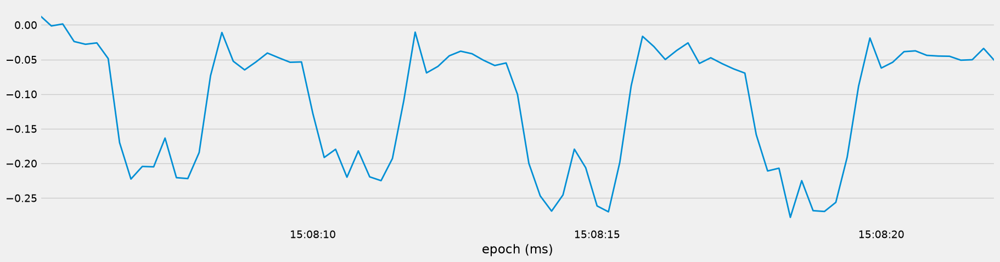

In [34]:
# This is the way to avoid using loop.
# Set the dataframe of interest
df_plot = df_bench

# Set the set number and the column of interest
df_plot[df_plot['set']==df_plot['set'].unique()[0]]['acc_x'].plot()
plt.show()

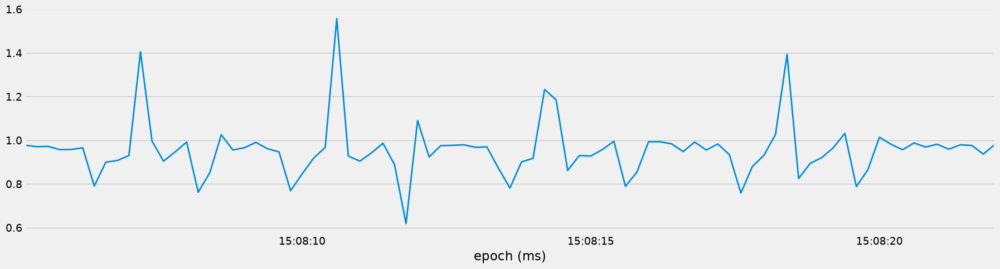

In [35]:
df_plot[df_plot['set']==df_plot['set'].unique()[0]]['acc_y'].plot()
plt.show()

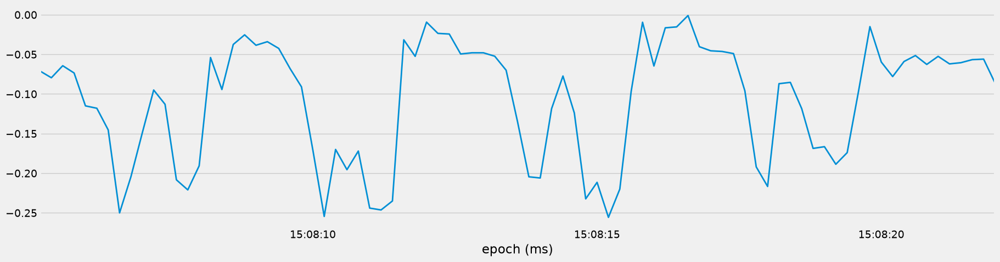

In [36]:
df_plot[df_plot['set']==df_plot['set'].unique()[0]]['acc_z'].plot()
plt.show()

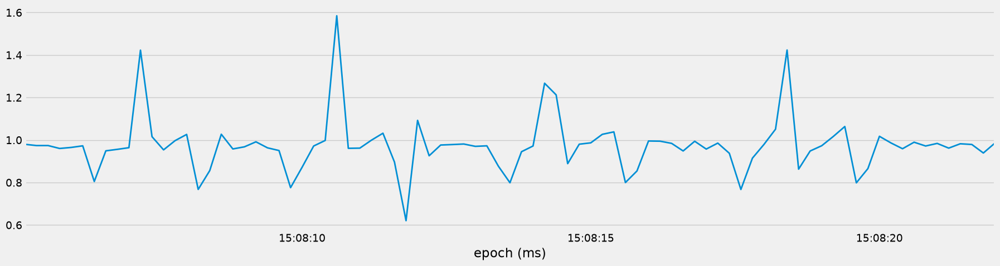

In [37]:
df_plot[df_plot['set']==df_plot['set'].unique()[0]]['acc_r'].plot()
plt.show()

* Gyroscope data

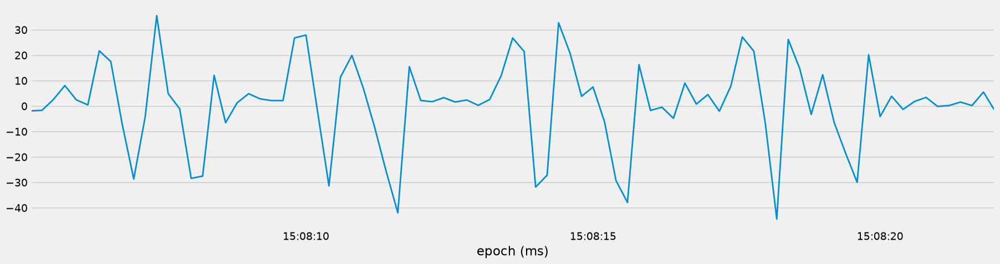

In [38]:
df_plot[df_plot['set']==df_plot['set'].unique()[0]]['gyro_x'].plot()
plt.show()

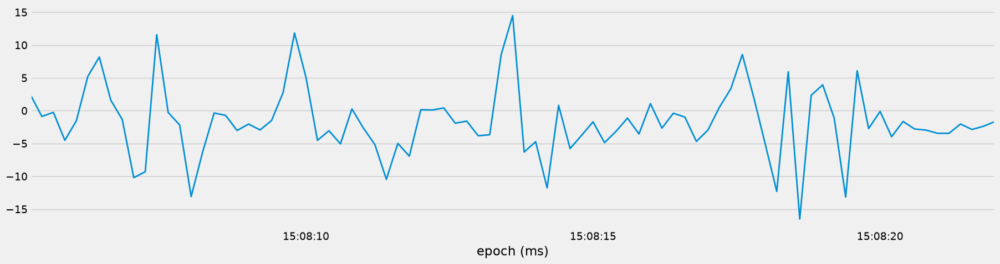

In [39]:
df_plot[df_plot['set']==df_plot['set'].unique()[0]]['gyro_y'].plot()
plt.show()

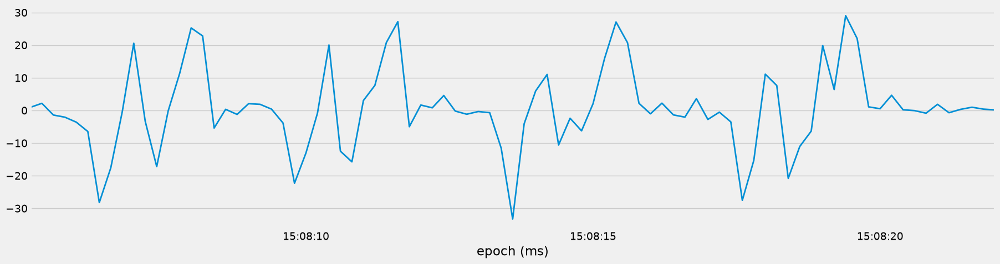

In [40]:
df_plot[df_plot['set']==df_plot['set'].unique()[0]]['gyro_z'].plot()
plt.show()

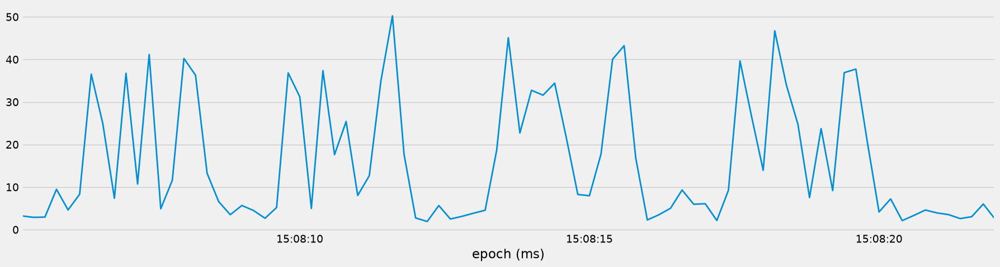

In [41]:
df_plot[df_plot['set']==df_plot['set'].unique()[0]]['gyro_r'].plot()
plt.show()

> NOTE: For **Bench Press**, it makes more sense to look at **accelerometer data** to count repetition.

## Low-pass filter

As we looked into before, the Low-Pass Filter is to smooth sensor data by removing high-frequency noise.

In [43]:
# Select only one set of an exercise
bench_set = df_bench[df_bench['set']==df_bench['set'].unique()[0]]
squat_set = df_squat[df_squat['set']==df_squat['set'].unique()[0]]
row_set = df_row[df_row['set']==df_row['set'].unique()[0]]
ohp_set = df_ohp[df_ohp['set']==df_ohp['set'].unique()[0]]
dead_set = df_dead[df_dead['set']==df_dead['set'].unique()[0]]

In [ ]:
# Parameters of low_pass_filter method
fs = 1000 / 200    # Sampling frequency
cutoff = 0.4       # Cutoff frequency < 0.5 * fs
LowPass = LowPassFilter()

* Before smoothing a set of Bench Press 

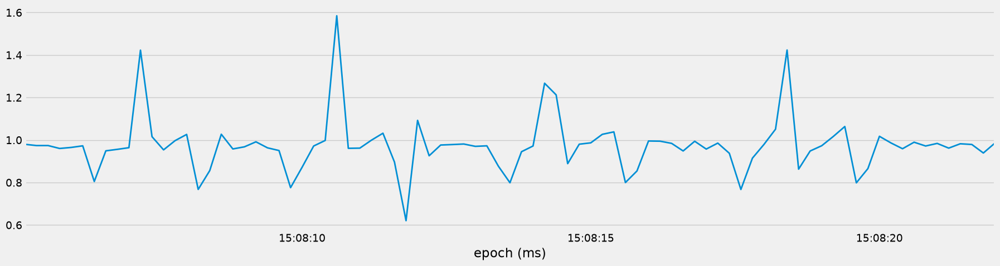

In [147]:
# Visualise a heavy set (5 repetition)
col = 'acc_r'

bench_set[col].plot()
plt.show()

* After smoothing a set of Bench Press 

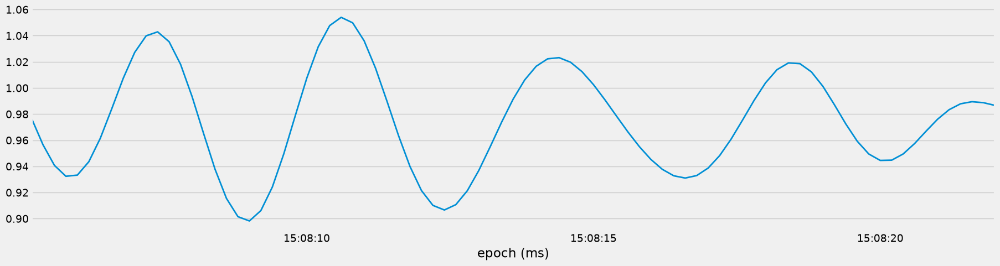

In [ ]:
# Apply low-pass filter
LowPass.low_pass_filter(
    bench_set, col, sampling_frequency=fs, cutoff_frequency=cutoff, order=10
)[col + '_lowpass'].plot()
plt.show()

* Before smoothing (on another column) - To see the parameters works well on another column

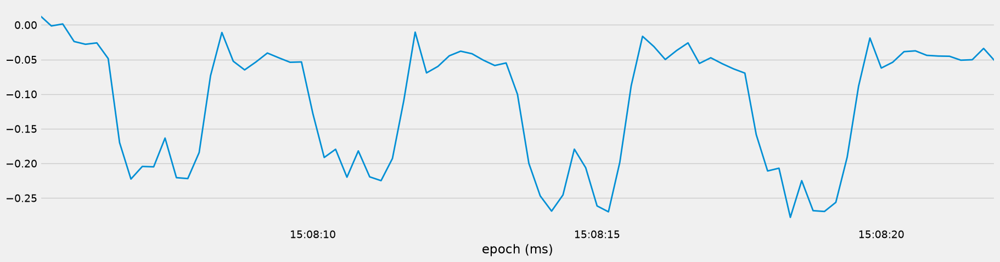

In [165]:
col = 'acc_x'

bench_set[col].plot()
plt.show()

* After smoothing (on another column)

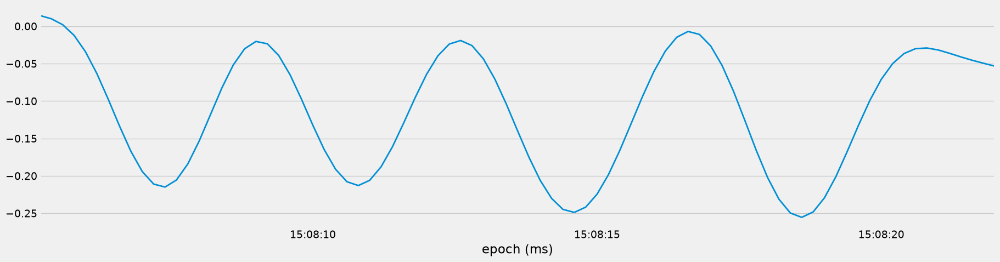

In [166]:
LowPass.low_pass_filter(
    bench_set, col, sampling_frequency=fs, cutoff_frequency=cutoff, order=10
)[col + '_lowpass'].plot()
plt.show()

> NOTE: As `acc_x`, `acc_y` and `acc_z` are components of `acc_r`, the same parameters seem to work well on them as well. But **we don't have to use all columns for an exercise, we only need one column** that best presents the repetition.

* Before smoothing a set of Barbell Row  - To see the parameters works well on another exercise set

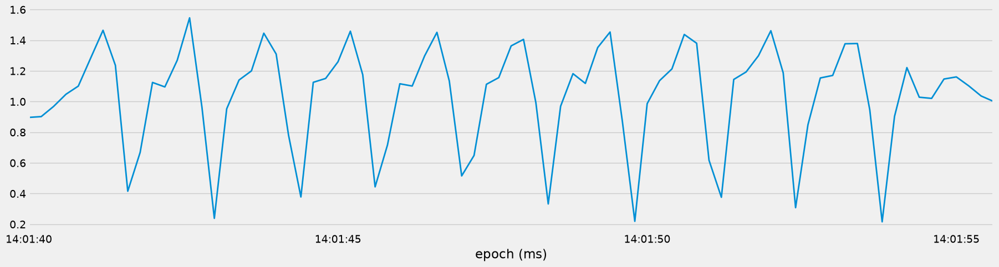

In [221]:
col = 'acc_r'

row_set[col].plot()
plt.show()

* After smoothing a set of Barbell Row

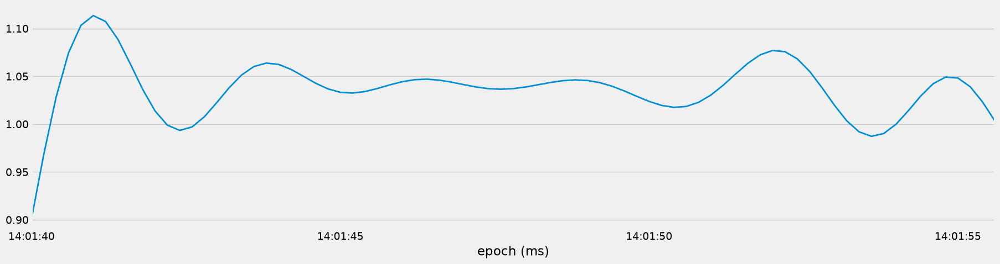

In [222]:
LowPass.low_pass_filter(
    row_set, col, sampling_frequency=fs, cutoff_frequency=cutoff, order=10
)[col + '_lowpass'].plot()
plt.show()

> NOTE: The same parameters that worked with Bench Press don't seem to work well with Barbell Row. It demonstrates we have to pick different parameters of low-pass filter for each exercise.

## Create function to count repetition

To count the repetition of an exercise, we can count the local maximum/minimum of the wave; these local maxima + minima are collectively called as `extrema`. The scipy function `argrelextrema` (argument of reletive extrema) returns the **indices of the extrema**, which can be translated into the number of repetition. 

**[Parameters]**
- **comparator**: `np.greater` (to find maxima), `np.less` (to find minima)
- **order**: How many points on each side to use for the comparison; the impact of order in counting extrema is quite negligible.

In [ ]:
# Inspect on an exercise.
col = 'acc_r'
fs = 1000 / 200    # Sampling frequency
cutoff = 0.4       # Cutoff frequency

data = LowPass.low_pass_filter(
    bench_set, col=col, sampling_frequency=fs, cutoff_frequency=cutoff, order=10
)

# Count the local maxima
# As the data is for heavy set, we expect to see 5 extrema.
peak_indices = argrelextrema(data[col+'_lowpass'].values, np.greater)
peaks = data.iloc[peak_indices]
peaks

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,participant,label,category,set,acc_r,gyro_r,acc_r_lowpass,acc_y_lowpass,acc_x_lowpass,acc_z_lowpass,gyro_x_lowpass,gyro_z_lowpass,gyro_y_lowpass,gyro_r_lowpass
epoch (ms),,,,,,,,,,,,,,,,,,,,
2019-01-11 15:08:07.400,-0.163500,0.996000,-0.113000,35.5488,11.5732,-17.2074,B,bench,heavy,30,1.015636,41.155203,1.042914,1.003024,-0.215017,-0.185311,-2.003388,2.844118,-2.335722,26.045546
2019-01-11 15:08:10.600,-0.220000,1.557000,-0.195500,11.3416,-5.0610,-12.4998,B,bench,heavy,30,1.584572,17.620744,1.054019,1.010448,-0.207924,-0.220591,1.327968,-1.500071,-1.826874,26.718627
2019-01-11 15:08:14.400,-0.245667,1.184667,-0.077333,32.7318,0.8050,-10.5852,B,bench,heavy,30,1.212340,34.410249,1.023173,0.976361,-0.244898,-0.189979,3.040687,-0.844171,-3.580795,29.496498
2019-01-11 15:08:18.400,-0.278000,1.393333,-0.085333,26.2194,5.9266,-20.8172,B,bench,heavy,30,1.423356,33.999079,1.019144,0.975114,-0.249722,-0.162388,1.843361,-2.647346,-2.677823,28.871099
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,30,0.978938,3.034609,0.989466,0.986568,-0.045538,-0.065643,0.923803,-1.948692,-2.692183,1.623403


In [256]:
# Create a function to use across exercises.
def count_reps(dataset, column='acc_r', sampling_frequency=5, cutoff_frequency=0.4, order=10):
    data = LowPass.low_pass_filter(
        dataset, column, sampling_frequency, cutoff_frequency, order
    )
    # Count the local maxima
    peak_indices = argrelextrema(data[column+'_lowpass'].values, np.greater)
    peaks = data.iloc[peak_indices]

    # Visualise the peaks
    fig, ax = plt.subplots()
    plt.plot(dataset[column+'_lowpass'])    # Entire column
    plt.plot(peaks[column+'_lowpass'], 'o')      # Only peak rows
    ax.set_ylabel(column+'_lowpass')
    exercies = dataset['label'].iloc[0].title()
    category = dataset['category'].iloc[0].title()
    plt.title(f'{exercies} - {category}: {len(peaks)} Repetitions')
    plt.show()

    return len(peaks)

* Bench Press

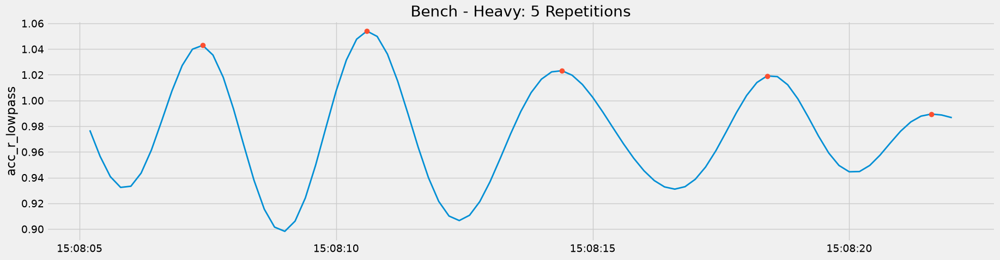

5

In [ ]:
count_reps(bench_set)

* Squat

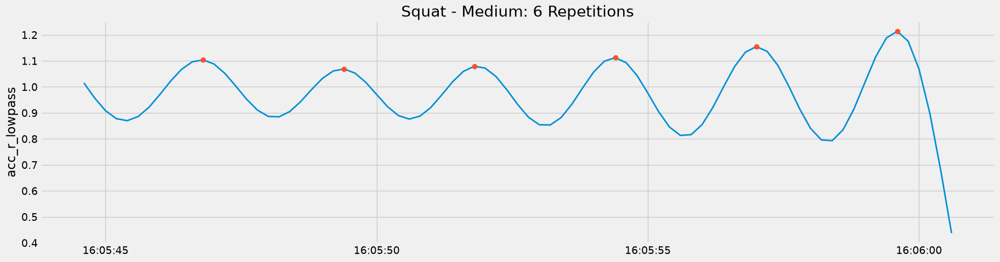

6

In [ ]:
count_reps(squat_set)     

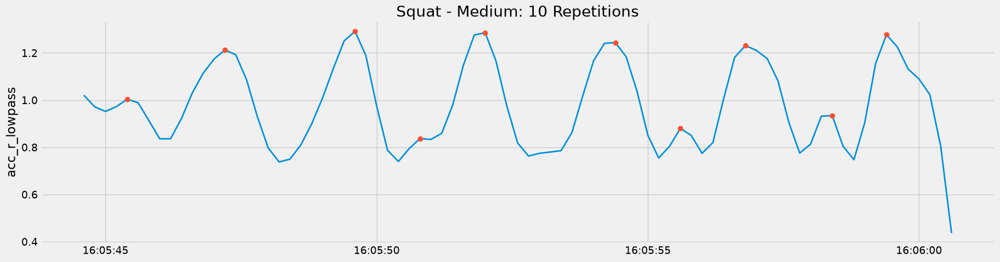

10

In [384]:
# Adjust parameters for the Squat
count_reps(squat_set, 'acc_r', cutoff_frequency=1.13)

* Barbell Row

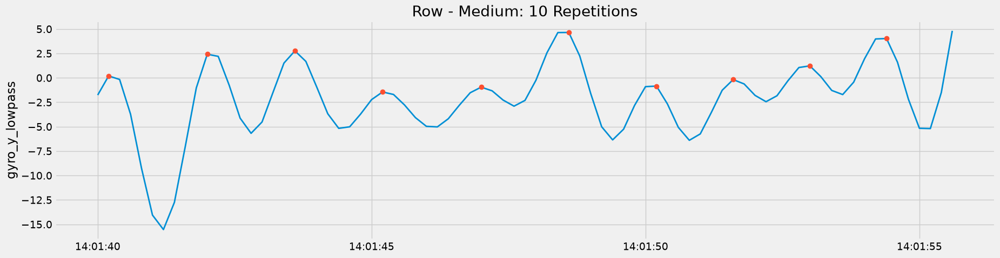

10

In [313]:
count_reps(row_set, 'gyro_y', cutoff_frequency=0.65)

* Overhead Press

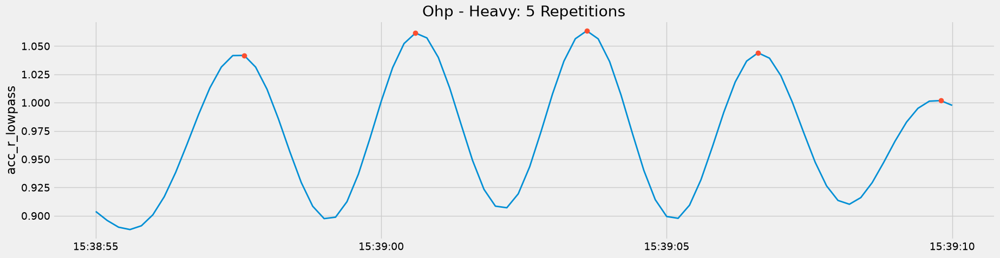

5

In [317]:
count_reps(ohp_set, cutoff_frequency=0.35)

* Deadlift

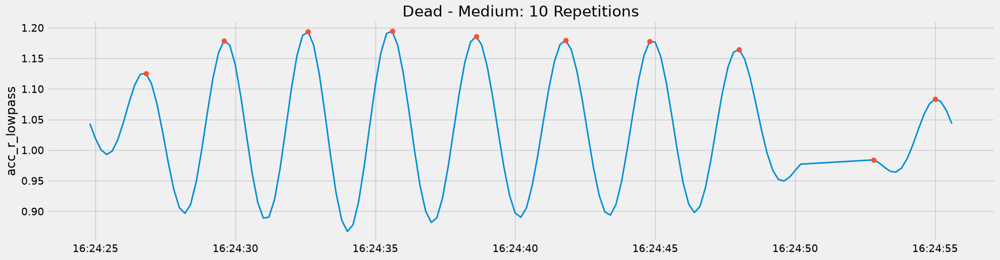

10

In [325]:
count_reps(dead_set)

> NOTE: The parameters that we just found are **only adjusted for the first set** of each exercise. See the next to generalise the parameters for all sets.

## Create a repetition benchmark dataframe

In [328]:
df['rep'] = df['category'].apply(lambda x: 5 if x == 'heavy' else 10)
df

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,participant,label,category,set,acc_r,gyro_r,rep
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30,0.979669,3.225625,5
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30,0.973752,2.887270,5
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30,0.973795,2.936720,5
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30,0.960118,9.473502,5
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30,0.964953,4.623585,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90,1.045408,5.804424,10
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90,1.032376,3.611408,10
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90,1.035995,5.869377,10


In [349]:
df_rep = df.groupby(['label', 'category', 'set'])['rep'].max().reset_index()
df_rep

,label,category,set,rep
0,bench,heavy,1,5
1,bench,heavy,2,5
2,bench,heavy,3,5
3,bench,heavy,4,5
4,bench,heavy,30,5
...,...,...,...,...
80,squat,medium,28,10
81,squat,medium,29,10
82,squat,medium,38,10
83,squat,medium,63,10


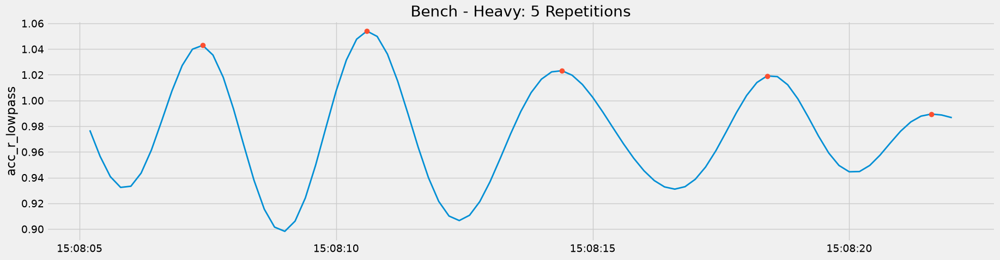

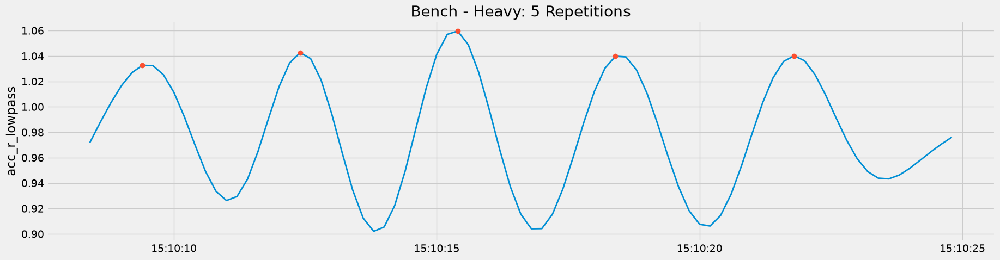

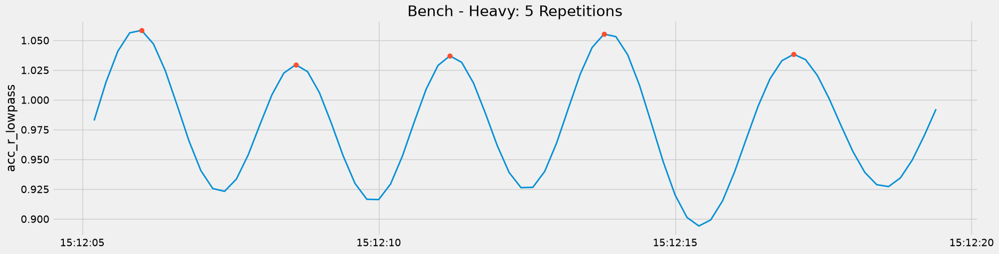

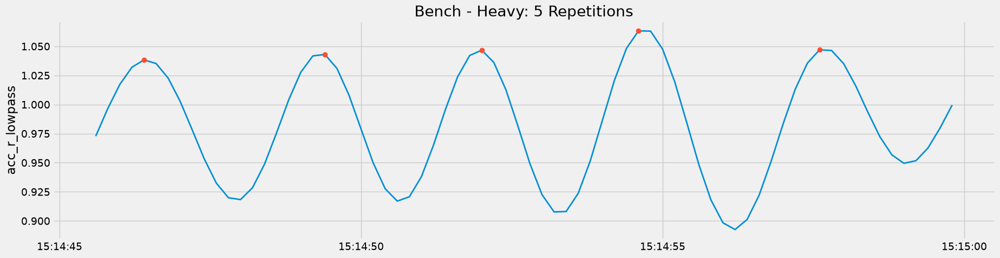

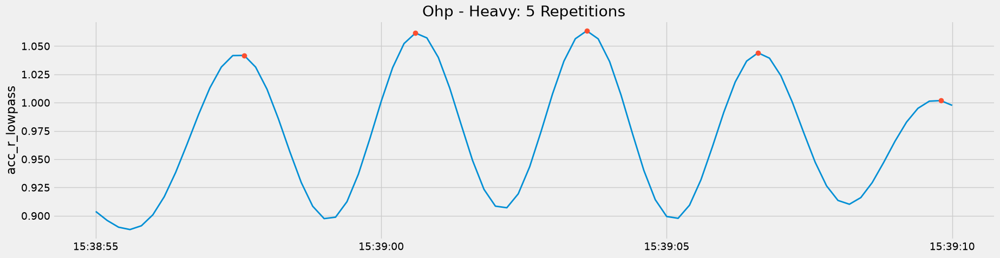

...

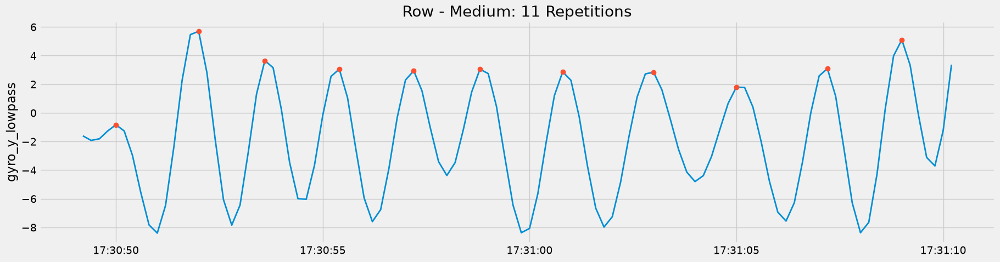

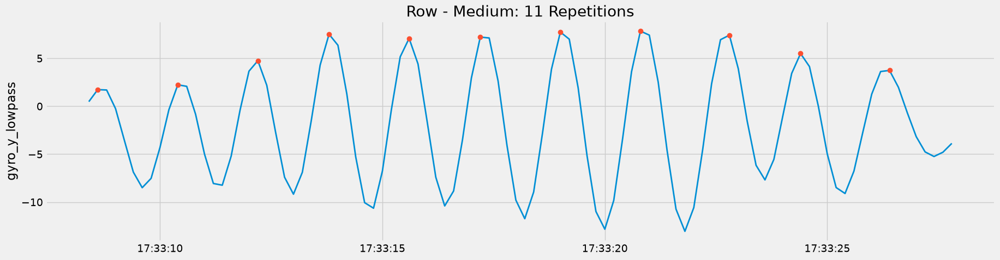

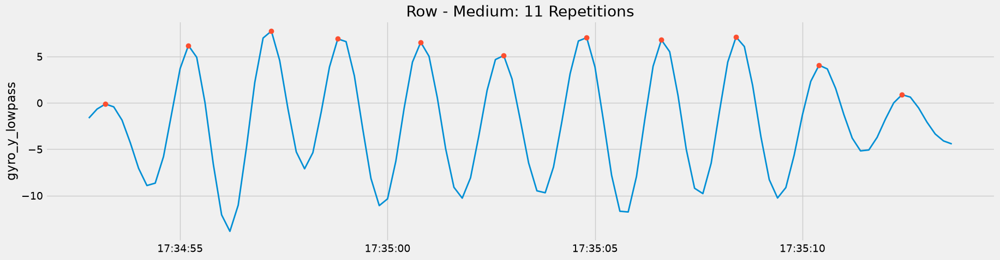

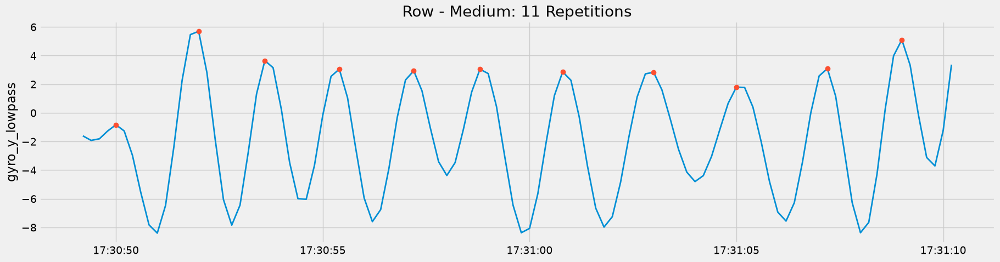

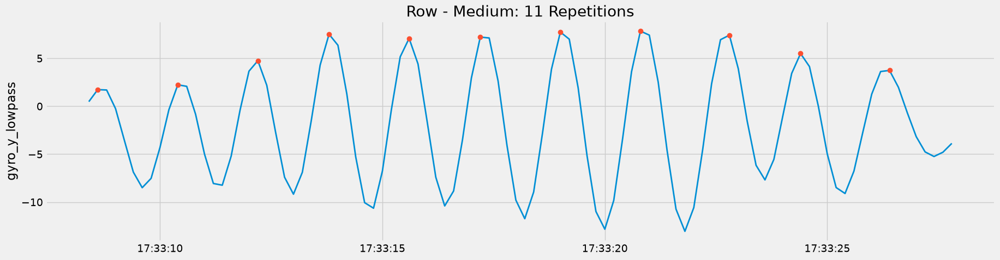

In [399]:
# Add predicted repetition counts
df_rep['rep_pred'] = 0

for s in df['set'].unique():
    # Set already defines the exercise and category
    df_set = df[df['set']==s]

    # Initialise the parameters
    column = 'acc_r'
    cutoff = 0.4

    if df_set['label'].iloc[0] == 'squat':
        cutoff = 0.35     
    elif df_set['label'].iloc[0]  == 'row':
        column = 'gyro_y'
        cutoff = 0.65
    elif df_set['label'].iloc[0]  == 'ohp':
        cutoff = 0.35

    num_reps = count_reps(df_set, column, cutoff_frequency=cutoff)
    df_rep.loc[df_rep['set']==s, 'rep_pred'] = num_reps

In [400]:
df_rep

,label,category,set,rep,rep_pred
0,bench,heavy,1,5,5
1,bench,heavy,2,5,4
2,bench,heavy,3,5,5
3,bench,heavy,4,5,5
4,bench,heavy,30,5,5
...,...,...,...,...,...
80,squat,medium,28,10,8
81,squat,medium,29,10,8
82,squat,medium,38,10,7
83,squat,medium,63,10,11


## Evaluate the results

In [401]:
round(mean_absolute_error(df_rep['rep'], df_rep['rep_pred']), 4)

0.9529

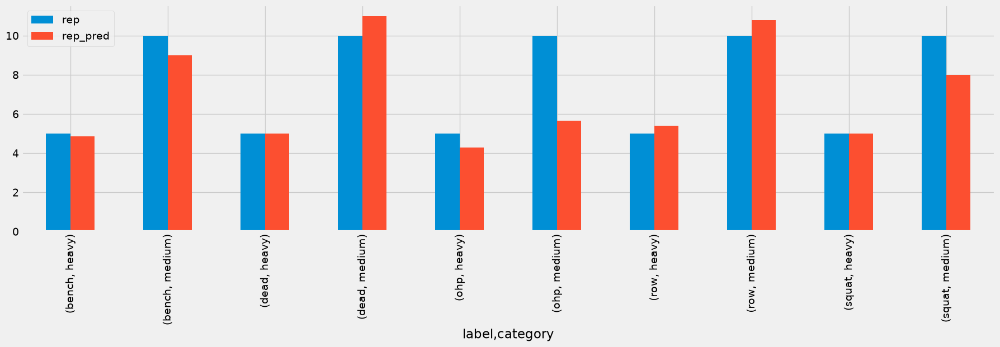

In [402]:
# Visualise the error
df_rep.groupby(['label', 'category'])[['rep', 'rep_pred']].mean().plot.bar()
plt.show()

Considering the graph above, we can tweak the parameters further to get better results.